In [1]:
library(ggplot2)
library(dplyr)
library(ggpubr)



Warning message:
“package ‘dplyr’ was built under R version 4.2.3”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values or values outside the scale range
(`geom_line()`).”


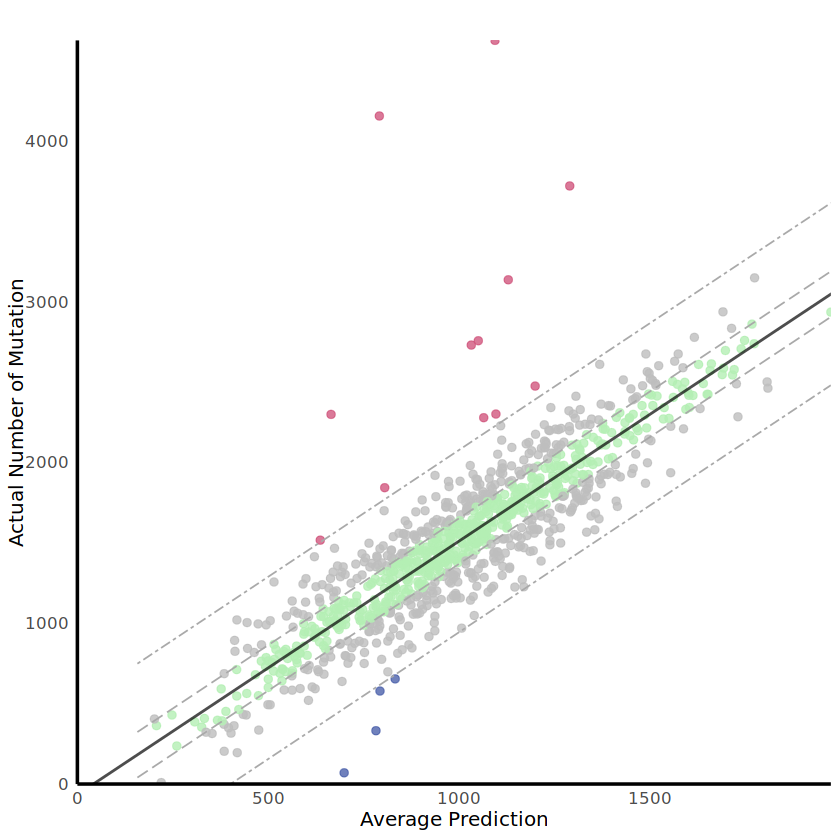

In [2]:
library(ggplot2)
library(dplyr)

# # Simulate Data

n <- 1000
set.seed(123)
x <- rnorm(1000, mean = 1000, sd = 300)
y <- 1.5 * x + rnorm(1000, mean = 0, sd = 200)

# Introduce distant outliers
outlier_indices <- sample(1:1000, 20)
y[outlier_indices] <- y[outlier_indices] + rnorm(20, mean = 0, sd = 1500)

df <- data.frame(x = x, y = y)



# Fit Linear Regression
#model <- lm(y ~ x)

model <- lm(y ~ x, data = df)
predicted <- predict(model)
residuals <- y - predicted

# Compute standardized residuals
std_resid <- residuals / sd(residuals)

# Identify outliers
outliers_high <- which(std_resid > 2)
outliers_low <- which(std_resid < -2)
high_predict<-which(abs(std_resid) < 0.5)
non_outliers <- setdiff(1:n, c(outliers_high, outliers_low,high_predict))

# Assign Colors
colors <- rep("grey", n)  # Default color for non-outliers
colors[outliers_high] <- "#D0587E"  # Over-predicted points
colors[outliers_low] <- "#4C62AB"   # Under-predicted points
colors[high_predict] <- "#B4EEB4"   # Under-predicted points


# Define the region around the regression line (parallel band within ±0.05 residuals)
within_band <- abs(std_resid) < 0.05

parallel_upper <- predicted + 0.5 * sd(residuals)
parallel_lower <- predicted - 0.5 * sd(residuals)

Outlier_lower<- predicted + ((-2) * sd(residuals))

Outlier_upper<- predicted + 2 * sd(residuals)

plot_data <- data.frame(
  x = x,
  y = y,
  std_resid = std_resid,
  colors = colors,
  predicted = predicted,
  parallel_upper = parallel_upper,
  parallel_lower = parallel_lower,
    Outlier_lower=Outlier_lower,
    Outlier_upper=Outlier_upper
)
intercept <- coef(model)[1]
slope <- coef(model)[2]


ggplot(plot_data, aes(x = x, y = y, color = colors)) +
  # Points colored by residual classification
  geom_point(size = 2, alpha = 0.8) +
  
  # Main Regression Line (thin and transparent)
  geom_abline(intercept = intercept, slope = slope, 
              color = "black", linewidth = 0.8, alpha = 0.7) +
  
  # Parallel Dotted Lines at ±0.05 Residuals
  geom_line(aes(y = parallel_upper), linetype = "longdash", color = "darkgrey", size = 0.5) +
  geom_line(aes(y = parallel_lower), linetype = "longdash", color = "darkgrey", size = 0.5) +
  geom_line(aes(y = Outlier_lower), linetype = "twodash", color = "darkgrey", size = 0.5) +
  geom_line(aes(y = Outlier_upper), linetype = "twodash", color = "darkgrey", size = 0.5) +

  # Ensure Axes Start from 0
  scale_x_continuous(expand = c(0, 0), limits = c(0, NA)) +
  scale_y_continuous(expand = c(0, 0), limits = c(0, NA)) +

  # Customize Colors and Theme
  scale_color_identity() +
  labs(
    title = " ",
    x = "Average Prediction",
    y = "Actual Number of Mutation"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    axis.title = element_text(size = 12),
    axis.text = element_text(size = 10),
    
    # Remove background & grid
    panel.grid = element_blank(),
    panel.background = element_blank(),
    
    # Add X and Y axis lines
    axis.line = element_line(color = "black", linewidth = 1)
  )


OutlierScatter <- ggplot(plot_data, aes(x = x, y = y, color = colors)) +
  # Points colored by residual classification
  geom_point(size = 2, alpha = 0.8) +
  
  # Main Regression Line (thin and transparent)
  geom_abline(intercept = intercept, slope = slope, 
              color = "black", linewidth = 0.8, alpha = 0.7) +
  
  # Parallel Dotted Lines at ±0.05 Residuals
  geom_line(aes(y = parallel_upper), linetype = "longdash", color = "darkgrey", size = 0.5) +
  geom_line(aes(y = parallel_lower), linetype = "longdash", color = "darkgrey", size = 0.5) +
  geom_line(aes(y = Outlier_lower), linetype = "twodash", color = "darkgrey", size = 0.5) +
  geom_line(aes(y = Outlier_upper), linetype = "twodash", color = "darkgrey", size = 0.5) +

  # Ensure Axes Start from 0
  scale_x_continuous(expand = c(0, 0), limits = c(0, NA)) +
  scale_y_continuous(expand = c(0, 0), limits = c(0, NA)) +

  # Customize Colors and Theme
  scale_color_identity() +
  labs(
    title = " ",
    x = "Average Prediction",
    y = "Actual Number of Mutation"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    axis.title = element_text(size = 12),
    axis.text = element_text(size = 10),
    
    # Remove background & grid
    panel.grid = element_blank(),
    panel.background = element_blank(),
    
    # Add X and Y axis lines
    axis.line = element_line(color = "black", linewidth = 1)
  )




In [3]:
write.table(plot_data,file="../paper/supplementary_files/sup11a.tsv",sep="\t",
            quote=F,row.names=F)


In [4]:
AccyrateResult<-readRDS("HighPredict_Bin_list.rds") #list data containing most-accurate bin information

In [5]:
AccyrateResult

x,avg_absolute_error,avg_errors_se,median_absolute_error,avg_prediction,median_prediction,actual,atac,residuals,std_residuals,abs_std_residuals,classification
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
chr1.5,45.398497,1.5505091,44.0447540,192.6015,193.9553,238,1205,42.314153,0.95062696,0.95062696,Others
chr1.6,33.819353,0.5325514,33.3255768,200.1806,200.6744,234,1684,30.896211,0.69414023,0.69414023,Others
chr1.7,26.173837,1.2261773,27.3232193,157.8262,156.6768,184,10627,22.349913,0.50213326,0.50213326,Others
chr1.8,-8.677231,0.6753964,-8.1727829,159.6772,159.1728,151,4465,-12.461789,-0.27997449,0.27997449,Others
chr1.9,18.502832,0.8196977,17.7893295,149.4972,150.2107,168,8785,14.501777,0.32583144,0.32583144,Others
chr1.11,-4.632076,0.5795882,-4.1061707,151.6321,151.1062,147,9506,-8.587739,-0.19294892,0.19294892,Others
chr1.12,-3.342935,0.9715236,-3.1107864,155.3429,155.1108,152,11516,-7.219669,-0.16220639,0.16220639,Others
chr1.15,11.642311,0.7612844,11.6487350,149.3577,149.3513,161,5512,7.638271,0.17161980,0.17161980,Others
chr1.16,-14.569728,1.7479985,-15.6425781,167.5697,168.6426,153,10153,-18.186437,-0.40857250,0.40857250,Others


In [6]:
for (i in 1:length(AccyrateResult)){

#df.test<-OutResult[[i]]
    AccyrateResult[[i]]$Cancer<-names(AccyrateResult)[i]
    print(names(AccyrateResult)[i])
print(table(AccyrateResult[[i]]$classification))


    
}

[1] "CNS-GBM"

High-predicted         Others 
           107           2021 
[1] "CNS-Medullo"

High-predicted         Others 
           107           2021 
[1] "Kidney-ChRCC"

High-predicted         Others 
           107           2021 
[1] "Liver-HCC"

High-predicted         Others 
           107           2021 
[1] "Lung-SCC"

High-predicted         Others 
           107           2021 
[1] "Skin-Melanoma"

High-predicted         Others 
           107           2021 


In [7]:
OutlierResult<-readRDS("Bin_list.rds") #list contaning Outlier bins information
OutlierResult

x,avg_absolute_error,avg_errors_se,median_absolute_error,avg_prediction,median_prediction,actual,atac,residuals,std_residuals,classification
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
chr1.5,45.398497,1.5505091,44.0447540,192.6015,193.9553,238,1205,42.314153,0.95062696,Accurate
chr1.6,33.819353,0.5325514,33.3255768,200.1806,200.6744,234,1684,30.896211,0.69414023,Accurate
chr1.7,26.173837,1.2261773,27.3232193,157.8262,156.6768,184,10627,22.349913,0.50213326,Accurate
chr1.8,-8.677231,0.6753964,-8.1727829,159.6772,159.1728,151,4465,-12.461789,-0.27997449,Accurate
chr1.9,18.502832,0.8196977,17.7893295,149.4972,150.2107,168,8785,14.501777,0.32583144,Accurate
chr1.11,-4.632076,0.5795882,-4.1061707,151.6321,151.1062,147,9506,-8.587739,-0.19294892,Accurate
chr1.12,-3.342935,0.9715236,-3.1107864,155.3429,155.1108,152,11516,-7.219669,-0.16220639,Accurate
chr1.15,11.642311,0.7612844,11.6487350,149.3577,149.3513,161,5512,7.638271,0.17161980,Accurate
chr1.16,-14.569728,1.7479985,-15.6425781,167.5697,168.6426,153,10153,-18.186437,-0.40857250,Accurate


In [9]:
for (i in 1:length(OutlierResult)){

#df.test<-OutResult[[i]]
    OutlierResult[[i]]$Cancer<-names(OutlierResult)[i]
    print(names(OutlierResult)[i])
print(table(OutlierResult[[i]]$classification))


    
}

[1] "CNS-GBM"

       Accurate  Over-predicted Under-predicted 
           2023              31              74 
[1] "CNS-Medullo"

       Accurate  Over-predicted Under-predicted 
           2024              28              76 
[1] "Kidney-ChRCC"

       Accurate  Over-predicted Under-predicted 
           2040              26              62 
[1] "Liver-HCC"

       Accurate  Over-predicted Under-predicted 
           1994              47              87 
[1] "Lung-SCC"

       Accurate  Over-predicted Under-predicted 
           2007              38              83 
[1] "Skin-Melanoma"

       Accurate  Over-predicted Under-predicted 
           2007              37              84 


In [10]:
###Making Unified Dataset
print(length(OutlierResult))
print(length(AccyrateResult))

for (i in 1:length(OutlierResult)){

print(names(OutlierResult)[i])

  #  print(names(AccyrateResult)[i])
print(table(AccyrateResult[[names(OutlierResult)[i]]]$classification))

HighPredictbin<-AccyrateResult[[names(OutlierResult)[i]]][which(AccyrateResult[[names(OutlierResult)[i]]]$classification=="High-predicted"),"x"]

OutlierResult[[names(OutlierResult)[i]]][which(OutlierResult[[names(OutlierResult)[i]]]$x %in% HighPredictbin),"classification"]<-"Most-accurate"
OutlierResult[[names(OutlierResult)[i]]][which(OutlierResult[[names(OutlierResult)[i]]]$classification=="Accurate"),"classification"]<-"Rest"

    
   print(table(OutlierResult[[names(OutlierResult)[i]]]$classification))
 
    
}
    





[1] 6
[1] 6
[1] "CNS-GBM"

High-predicted         Others 
           107           2021 

  Most-accurate  Over-predicted            Rest Under-predicted 
            107              31            1916              74 
[1] "CNS-Medullo"

High-predicted         Others 
           107           2021 

  Most-accurate  Over-predicted            Rest Under-predicted 
            107              28            1917              76 
[1] "Kidney-ChRCC"

High-predicted         Others 
           107           2021 

  Most-accurate  Over-predicted            Rest Under-predicted 
            107              26            1933              62 
[1] "Liver-HCC"

High-predicted         Others 
           107           2021 

  Most-accurate  Over-predicted            Rest Under-predicted 
            107              47            1887              87 
[1] "Lung-SCC"

High-predicted         Others 
           107           2021 

  Most-accurate  Over-predicted            Rest Under-predicted 
 

In [11]:
names(OutlierResult)

[1] "CNS-GBM"       "CNS-Medullo"   "Kidney-ChRCC"  "Liver-HCC"    
[5] "Lung-SCC"      "Skin-Melanoma"

In [12]:
head(OutlierResult["CNS-GBM"])

x,avg_absolute_error,avg_errors_se,median_absolute_error,avg_prediction,median_prediction,actual,atac,residuals,std_residuals,classification,Cancer
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
chr1.5,45.398497,1.5505091,44.0447540,192.6015,193.9553,238,1205,42.314153,0.95062696,Rest,CNS-GBM
chr1.6,33.819353,0.5325514,33.3255768,200.1806,200.6744,234,1684,30.896211,0.69414023,Rest,CNS-GBM
chr1.7,26.173837,1.2261773,27.3232193,157.8262,156.6768,184,10627,22.349913,0.50213326,Rest,CNS-GBM
chr1.8,-8.677231,0.6753964,-8.1727829,159.6772,159.1728,151,4465,-12.461789,-0.27997449,Rest,CNS-GBM
chr1.9,18.502832,0.8196977,17.7893295,149.4972,150.2107,168,8785,14.501777,0.32583144,Rest,CNS-GBM
chr1.11,-4.632076,0.5795882,-4.1061707,151.6321,151.1062,147,9506,-8.587739,-0.19294892,Rest,CNS-GBM
chr1.12,-3.342935,0.9715236,-3.1107864,155.3429,155.1108,152,11516,-7.219669,-0.16220639,Rest,CNS-GBM
chr1.15,11.642311,0.7612844,11.6487350,149.3577,149.3513,161,5512,7.638271,0.17161980,Rest,CNS-GBM
chr1.16,-14.569728,1.7479985,-15.6425781,167.5697,168.6426,153,10153,-18.186437,-0.40857250,Rest,CNS-GBM


In [13]:
for (cancer_type in names(OutlierResult)) {
  df <- OutlierResult[[cancer_type]]
  
  df_filtered <- df[df$classification != "Rest", ]
  df_filtered<-df_filtered[,c(1,11)]
  if (nrow(df_filtered) == 0) next
 

}

In [14]:
table(OutlierResult$`CNS-GBM`[,"classification"])


  Most-accurate  Over-predicted            Rest Under-predicted 
            107              31            1916              74 

In [15]:
head(OutlierResult)

x,avg_absolute_error,avg_errors_se,median_absolute_error,avg_prediction,median_prediction,actual,atac,residuals,std_residuals,classification,Cancer
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
chr1.5,45.398497,1.5505091,44.0447540,192.6015,193.9553,238,1205,42.314153,0.95062696,Rest,CNS-GBM
chr1.6,33.819353,0.5325514,33.3255768,200.1806,200.6744,234,1684,30.896211,0.69414023,Rest,CNS-GBM
chr1.7,26.173837,1.2261773,27.3232193,157.8262,156.6768,184,10627,22.349913,0.50213326,Rest,CNS-GBM
chr1.8,-8.677231,0.6753964,-8.1727829,159.6772,159.1728,151,4465,-12.461789,-0.27997449,Rest,CNS-GBM
chr1.9,18.502832,0.8196977,17.7893295,149.4972,150.2107,168,8785,14.501777,0.32583144,Rest,CNS-GBM
chr1.11,-4.632076,0.5795882,-4.1061707,151.6321,151.1062,147,9506,-8.587739,-0.19294892,Rest,CNS-GBM
chr1.12,-3.342935,0.9715236,-3.1107864,155.3429,155.1108,152,11516,-7.219669,-0.16220639,Rest,CNS-GBM
chr1.15,11.642311,0.7612844,11.6487350,149.3577,149.3513,161,5512,7.638271,0.17161980,Rest,CNS-GBM
chr1.16,-14.569728,1.7479985,-15.6425781,167.5697,168.6426,153,10153,-18.186437,-0.40857250,Rest,CNS-GBM


In [16]:
#Check Overlapped bins count per category
# Vector of the classification categories of interest
categories <- c("Most-accurate", "Over-predicted", "Under-predicted")

# Prepare a list to hold the overlap tables
overlap_tables <- list()

for (cat in categories) {
  # 1. For each element, get the row names ("x") where classification == cat
  lists_of_x <- lapply(OutlierResult, function(df) {
    rownames(df)[ df$classification == cat ]
  })
  
  # 2. All unique x’s across the six elements
  all_x <- unique(unlist(lists_of_x))
  
  # 3. For each x, count in how many elements it appears
  counts_per_x <- sapply(all_x, function(x) {
    sum(sapply(lists_of_x, function(v) x %in% v))
  })
  
  # 4. Tabulate: how many x’s are shared by 1, 2, …, up to 6 elements
  overlap_tables[[cat]] <- table(counts_per_x)
}

# Print results
for (cat in categories) {
  cat("\nClassification:", cat, "\n")
  print(overlap_tables[[cat]])
}


Classification: Most-accurate 
counts_per_x
  1   2   3   4 
489  64   7   1 

Classification: Over-predicted 
counts_per_x
  1   2   3 
133  34   2 

Classification: Under-predicted 
counts_per_x
  1   2   3   4   5   6 
231  62  21   8   2   1 


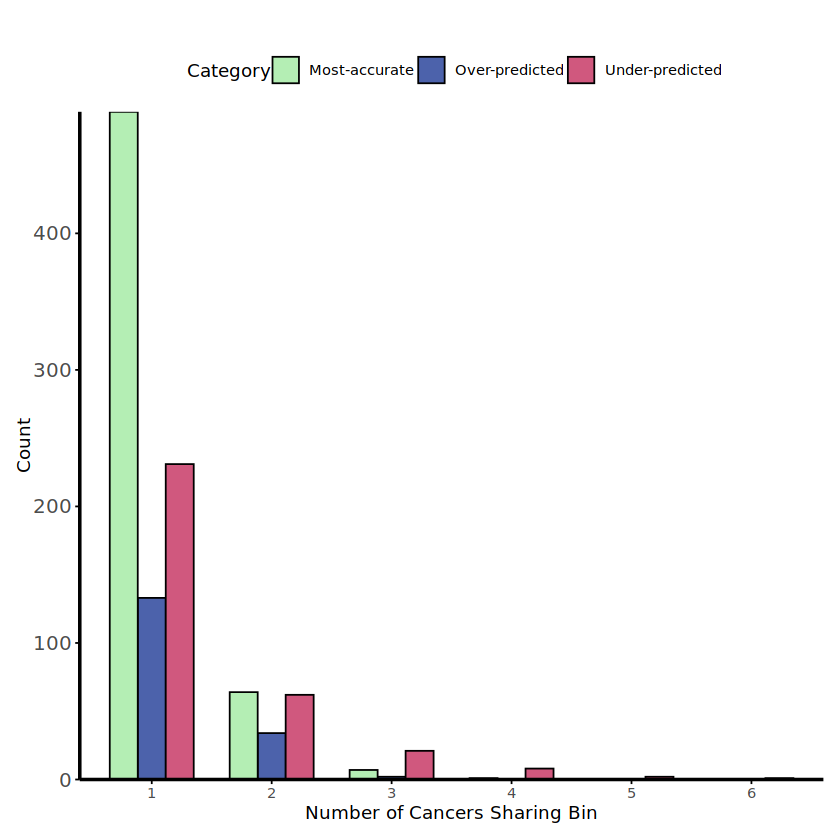

In [17]:
colors <- c( "Over-predicted" = "#4C62AB", "Under-predicted" = "#D0587E","Most-accurate" = "#B4EEB4")


df_plot <- data.frame(
    Category=c(rep("Over-predicted",6),rep("Under-predicted",6),rep("Most-accurate",6)),
  Over_predicted_Count = c(1, 2, 3,4,5,6,
                           1, 2, 3,4,5,6,
                           1,2,3,4,5,6),
  Count = c(133, 34, 2,0,0,0, 
            231, 62, 21,8,2,1,
            489,64,7,1,0,0)
)


ggplot(df_plot, aes(x = factor(Over_predicted_Count), y = Count, fill = Category)) +
  geom_bar(stat = "identity", position = "dodge", width = 0.7, color = "black") +  # Add bar outline
  scale_fill_manual(values = colors) +  # Custom colors
  labs(x = "Number of Cancers Sharing Bin", y = "Count", title = "") +
  scale_y_continuous(expand = c(0, 0)) +  # Remove gap between bars and x-axis
  theme_minimal() +
  theme(
    legend.position = "top",
    axis.text.x = element_text(angle = 0, hjust = 0.5, vjust = 1),  # Adjust x-axis text position
    axis.text.y = element_text(size = 12),  # Ensure y-axis ticks are visible
    axis.ticks = element_line(color = "black"),  # Add axis ticks
    axis.line = element_line(color = "black", linewidth = 1),  # Add x and y-axis lines
    panel.grid = element_blank(),  # Remove all grid lines
    panel.background = element_blank(),  # Remove background
    plot.margin = margin(10, 10, 10, 10)  # Reduce empty space around the plot
  )

outlierbarplot<-ggplot(df_plot, aes(x = factor(Over_predicted_Count), y = Count, fill = Category)) +
  geom_bar(stat = "identity", position = "dodge", width = 0.7, color = "black") +  # Add bar outline
  scale_fill_manual(values = colors) +  # Custom colors
  labs(x = "Number of Cancers Sharing Bin", y = "Count", title = "") +
  scale_y_continuous(expand = c(0, 0)) +  # Remove gap between bars and x-axis
  theme_minimal() +
  theme(
    legend.position = "top",
    axis.text.x = element_text(angle = 0, hjust = 0.5, vjust = 1),  # Adjust x-axis text position
    axis.text.y = element_text(size = 12),  # Ensure y-axis ticks are visible
    axis.ticks = element_line(color = "black"),  # Add axis ticks
    axis.line = element_line(color = "black", linewidth = 1),  # Add x and y-axis lines
    panel.grid = element_blank(),  # Remove all grid lines
    panel.background = element_blank(),  # Remove background
    plot.margin = margin(10, 10, 10, 10)  # Reduce empty space around the plot
  )

In [18]:
#/hpc/users/leew17/Work/CellOrigin/Git/epigenetic_effects_on_mutational_landscape/paper/source_data
write.table(df_plot,file="../paper/supplementary_files/sup11b.tsv",sep="\t",
            quote=F,row.names=F)


In [19]:
#Load Bins mapped to Gene and genomic location information from Biomart
BinGene<-data.frame(read.table("Bin_ReferecneChomromseOnly_Gene_chr_Position_mart_export_hg19.bed"))

BinGene<-BinGene[,c(4,8)]
colnames(BinGene)<-c("Bin_name","Gene")
BinGene_unique <- BinGene %>% distinct(Gene, .keep_all = TRUE)


In [22]:

  # Define a helper function to process each file
  process_scATAC_file <- function(cancer_type, sCellName) {
       scATACFile<-paste0("scATAC/",sCellName,".rds") #Load scATAC fragment cout data 
    scATAC <- readRDS(scATACFile)
    colnames(scATAC)<-"NormalizedCounts"
    scATAC$Bin_name<-rownames(scATAC)


    # Extract relevant bins for the given cancer type
    TargetBin <- OutlierResult[[cancer_type]]
    colnames(TargetBin)[1] <- "Bin_name"
    TargetBin <- TargetBin[, c("Bin_name", "classification")]

    # Merge TargetBin with the Histone data
    merged_data <- merge(TargetBin, scATAC, by = "Bin_name")
merged_data$classification<-factor(merged_data$classification,levels = c("Most-accurate","Over-predicted","Under-predicted","Rest"))

    # Define colors for classification groups
 colors <- c("Rest" = "gray80", "Over-predicted" = "#4C62AB", "Under-predicted" = "#D0587E","Most-accurate" = "#B4EEB4")

    # Generate the boxplot
    p <- ggplot(merged_data, aes(x = classification, y = NormalizedCounts, fill = classification)) +
      geom_boxplot(outlier.shape = NA, alpha = 0.8) +
      scale_fill_manual(values = colors) +
      scale_y_log10() +
      theme_minimal(base_size = 14) +
      labs(title = paste(cancer_type),
           x = "",
           y = "Normalized fragment counts") +
      stat_compare_means(comparisons = list(c("Rest", "Over-predicted"),
                                            c("Rest", "Under-predicted"),
                                            c("Rest", "Most-accurate")),
                         method = "wilcox.test",
                         label = "p.format") +
        theme(
        legend.position = "top",
        axis.text.x = element_text(angle = 45, hjust = 1),    
        panel.grid = element_blank(),       # Remove all grid lines
        panel.background = element_blank(), # Remove background
        axis.ticks.y = element_line(color = "black", size = 0.5),  # Add y-axis ticks
        axis.line.y = element_line(color = "black", size = 0.8)    # Add y-axis line
    )


    return(p)

  }


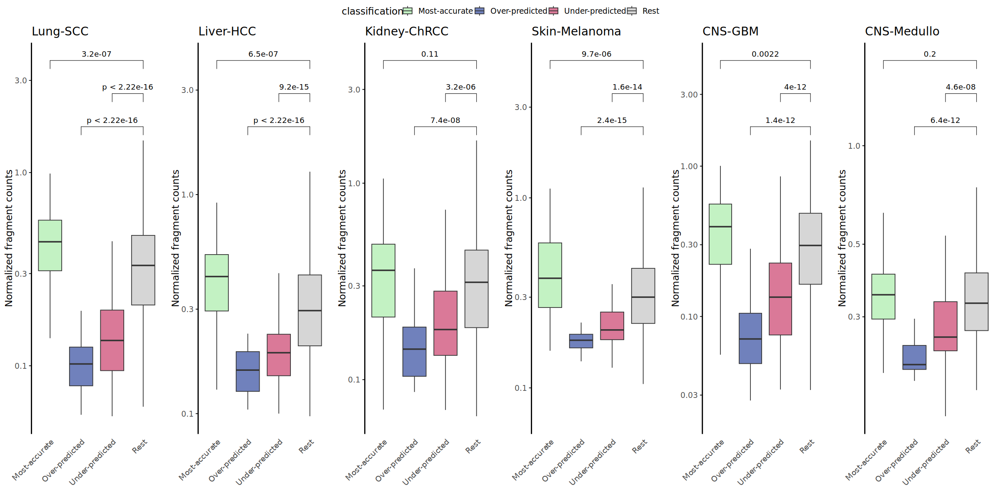

In [24]:
options(repr.plot.width=20)
options(repr.plot.height=10)
library(dplyr)# Load required libraries
library(ggplot2)
library(dplyr)
library(ggpubr)
cancer_types <- c('Lung-SCC',"Liver-HCC", "Kidney-ChRCC","Skin-Melanoma",'CNS-GBM','CNS-Medullo')  # Example multiple cancer types
TargetTissue_types<-c("Tsankov_Basal","Shendure_Hepatoblast","Yang_PTPL","Bingren_Melanocyte","Greenleaf_mGPC","Shendure_Granule")

# Generate all plots and store them in a list
plot_list <- mapply(process_scATAC_file, cancer_types, TargetTissue_types, SIMPLIFY = FALSE)

# Arrange multiple plots into one figure (facet-like layout)
final_plot <- ggarrange(plotlist = plot_list, ncol = 6, nrow = 1, common.legend = TRUE, legend = "top")



  # Combine all plots into one with columns merged
  combined_plot <- ggarrange(plotlist = plot_list, ncol = length(plot_list), common.legend = TRUE, nrow = 1)
combined_plot


In [25]:
library(ggplot2)
library(dplyr)
library(ggpubr)

# Define the function to generate plots
generate_boxplot <- function(cancer_type, RNAfile) {
  
  # Read RNA data
  RNAPath <- paste0("/GTEX_Average/", RNAfile) #Load average expression of GTEX data
  TPM <- data.frame(read.table(RNAPath, header = TRUE))
  
  # Extract relevant bins for the given cancer type
  TargetBin <- OutlierResult[[cancer_type]]
  colnames(TargetBin)[1] <- "Bin_name"
  TargetBin <- TargetBin[, c("Bin_name", "classification")]

  colnames(TPM)[c(2,3)] <- c("Gene", "TPM")
  TPM_unique <- TPM %>% distinct(Gene, .keep_all = TRUE)

  # Step 1: Left join TargetBin with BinGene using "Bin_name"
  merged_data <- merge(TargetBin, BinGene_unique, by = "Bin_name", all.x = TRUE)

  # Step 2: Left join the merged data with TPM using "Gene"
  final_data <- merge(merged_data, TPM_unique, by = "Gene", all.x = TRUE)

  # Remove NA values from TPM
  final_data_clean <- final_data %>% filter(!is.na(TPM))
final_data_clean$classification<-factor(final_data_clean$classification,levels = c("Most-accurate","Over-predicted","Under-predicted","Rest"))

  # Define colors for classification groups
  colors <- c("Rest" = "gray80", "Over-predicted" = "#4C62AB", "Under-predicted" = "#D0587E","Most-accurate" = "#B4EEB4")

  # Perform pairwise Wilcoxon test
  stat_test <- compare_means(TPM ~ classification, 
                             data = final_data_clean, 
                             method = "wilcox.test",
                             paired = FALSE)

  # Generate the boxplot
  p <- ggplot(final_data_clean, aes(x = classification, y = TPM, fill = classification)) +
    geom_boxplot(outlier.shape = NA, alpha = 0.8) + 
    scale_fill_manual(values = colors) + 
    scale_y_log10() +  # Log scale for better visualization
    theme_minimal(base_size = 14) + 
    labs(title = paste(cancer_type), # Add plot title
         x = "", 
         y = "Average TPM") +
    stat_compare_means(comparisons = list(c("Rest", "Most-accurate"), 
                                          c("Rest", "Under-predicted"),
                                          c("Rest", "Over-predicted")
                                         ),
                       method = "wilcox.test",
                       label = "p.format") + # Add p-values
      theme(
        legend.position = "top",
        axis.text.x = element_text(angle = 45, hjust = 1),    
        panel.grid = element_blank(),       # Remove all grid lines
        panel.background = element_blank(), # Remove background
        axis.ticks.y = element_line(color = "black", size = 0.5),  # Add y-axis ticks
        axis.line.y = element_line(color = "black", size = 0.8)    # Add y-axis line
    )

  return(p)
}


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 681 rows containing non-finite outside the scale range
(`stat_boxplot()`).”
Warning message:
“Removed 681 rows containing non-finite outside the scale range
(`stat_signif()`).”
Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 681 rows containing non-finite outside the scale range
(`stat_boxplot()`).”
Warning message:
“Removed 681 rows containing non-finite outside the scale range
(`stat_signif()`).”
Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 1421 rows containing non-finite outside 

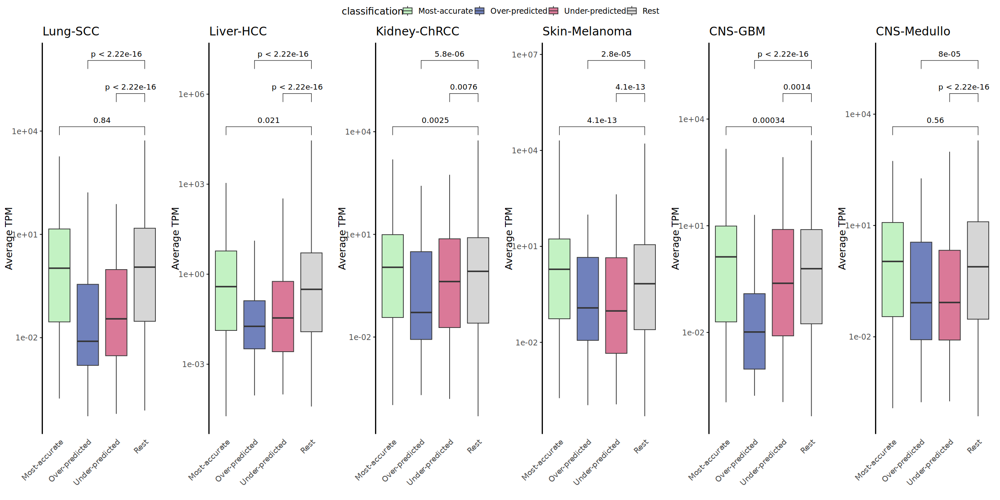

In [26]:
options(repr.plot.width=20)
options(repr.plot.height=10)
# Define multiple cancer types and RNA files
cancer_types <- c('Lung-SCC',"Liver-HCC", "Kidney-ChRCC", "Skin-Melanoma",'CNS-GBM','CNS-Medullo')  # Example multiple cancer types
RNAfiles <- c("gene_tpm_v10_lung","gene_tpm_v10_liver", "gene_tpm_v10_kidney_cortex", "gene_tpm_v10_skin_not_sun_exposed_suprapubic",
             "gene_tpm_v10_brain_cortex","gene_tpm_v10_brain_cerebellum")

# Generate all plots and store them in a list
plot_list <- mapply(generate_boxplot, cancer_types, RNAfiles, SIMPLIFY = FALSE)

# Arrange multiple plots into one figure (facet-like layout)
final_plot <- ggarrange(plotlist = plot_list, ncol = 6, nrow = 1, common.legend = TRUE, legend = "top")

# Display the combined plot
print(final_plot)

In [27]:

  # Define a helper function to process each file
  process_histone_file <- function(cancer_type, TargetTissue) {
     #Load average histon coverage data from Roadmap Epingenomics 
    TargetDir <- paste0("ROAD_MAP_Epigenomics/", TargetTissue, "/coverage/average")
    # Read the histone data
      HistoneFile<-paste0(TargetDir,"/H3K27ac_average.bed")
    Histone <- data.frame(read.table(HistoneFile, header = TRUE))
    histone_mark <- strsplit(basename(HistoneFile), "_")[[1]][1]
    colnames(Histone) <- c("chr", "start", "end", "Bin_name", "Histone")

    # Extract relevant bins for the given cancer type
    TargetBin <- OutlierResult[[cancer_type]]
    colnames(TargetBin)[1] <- "Bin_name"
    TargetBin <- TargetBin[, c("Bin_name", "classification")]

    # Merge TargetBin with the Histone data
    merged_data <- merge(TargetBin, Histone, by = "Bin_name")
merged_data$classification<-factor(merged_data$classification,levels = c("Most-accurate","Over-predicted","Under-predicted","Rest"))

    # Define colors for classification groups
 colors <- c("Rest" = "gray80", "Over-predicted" = "#4C62AB", "Under-predicted" = "#D0587E","Most-accurate" = "#B4EEB4")

    # Generate the boxplot
    p <- ggplot(merged_data, aes(x = classification, y = Histone, fill = classification)) +
      geom_boxplot(outlier.shape = NA, alpha = 0.8) +
      scale_fill_manual(values = colors) +
      scale_y_log10() +
      theme_minimal(base_size = 14) +
      labs(title = paste(cancer_type),
           x = "",
           y = "Average FPKM") +
      stat_compare_means(comparisons = list(c("Rest", "Over-predicted"),
                                            c("Rest", "Under-predicted"),
                                            c("Rest", "Most-accurate")),
                         method = "wilcox.test",
                         label = "p.format") +
         theme(
        legend.position = "top",
        axis.text.x = element_text(angle = 45, hjust = 1),    
        panel.grid = element_blank(),       # Remove all grid lines
        panel.background = element_blank(), # Remove background
        axis.ticks.y = element_line(color = "black", size = 0.5),  # Add y-axis ticks
        axis.line.y = element_line(color = "black", size = 0.8)    # Add y-axis line
    )


    return(p)
  }


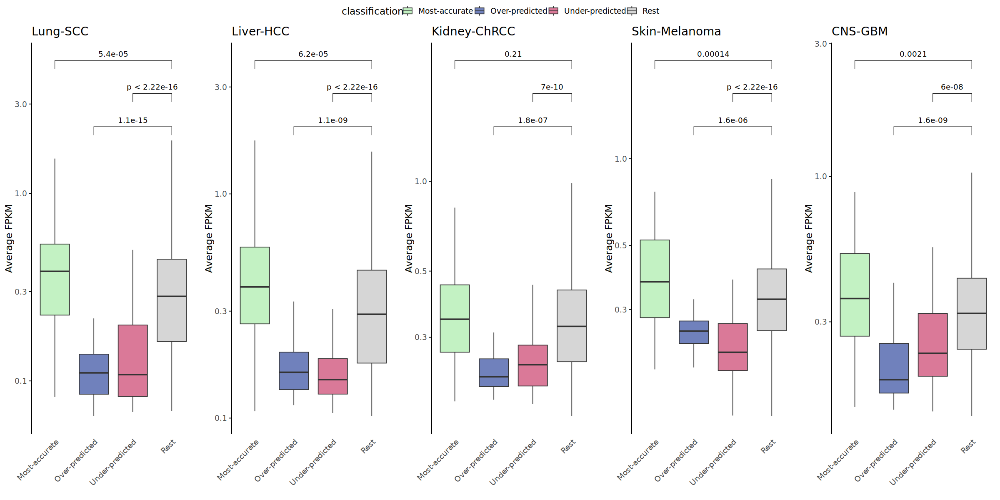

In [28]:
options(repr.plot.width=20)
options(repr.plot.height=10)
cancer_types <- c('Lung-SCC',"Liver-HCC", "Kidney-ChRCC","Skin-Melanoma",'CNS-GBM')  # Example multiple cancer types
TargetTissue_types<-c("Lung","Liver","Kidney","Skin","Brain_Cortex")


# Generate all plots and store them in a list
plot_list <- mapply(process_histone_file, cancer_types, TargetTissue_types, SIMPLIFY = FALSE)

# Arrange multiple plots into one figure (facet-like layout)
final_plot <- ggarrange(plotlist = plot_list, ncol = 6, nrow = 1, common.legend = TRUE, legend = "top")



  # Combine all plots into one with columns merged
  combined_plot <- ggarrange(plotlist = plot_list, ncol = length(plot_list), common.legend = TRUE, nrow = 1)
combined_plot

In [29]:

  # Define a helper function to process each file
  process_histone_file <- function(cancer_type, TargetTissue) {
      #Load average histon coverage data from Roadmap Epingenomics 
    TargetDir <- paste0("/hpc/users/leew17/Work/CellOrigin/Data/Revision/ROAD_MAP_Epigenomics/", TargetTissue, "/coverage/average")
    # Read the histone data
      HistoneFile<-paste0(TargetDir,"/H3K9me3_average.bed")
    Histone <- data.frame(read.table(HistoneFile, header = TRUE))
    histone_mark <- strsplit(basename(HistoneFile), "_")[[1]][1]
    colnames(Histone) <- c("chr", "start", "end", "Bin_name", "Histone")

    # Extract relevant bins for the given cancer type
    TargetBin <- OutlierResult[[cancer_type]]
    colnames(TargetBin)[1] <- "Bin_name"
    TargetBin <- TargetBin[, c("Bin_name", "classification")]

    # Merge TargetBin with the Histone data
    merged_data <- merge(TargetBin, Histone, by = "Bin_name")
merged_data$classification<-factor(merged_data$classification,levels = c("Most-accurate","Over-predicted","Under-predicted","Rest"))

    # Define colors for classification groups
 colors <- c("Rest" = "gray80", "Over-predicted" = "#4C62AB", "Under-predicted" = "#D0587E","Most-accurate" = "#B4EEB4")

    # Generate the boxplot
    p <- ggplot(merged_data, aes(x = classification, y = Histone, fill = classification)) +
      geom_boxplot(outlier.shape = NA, alpha = 0.8) +
      scale_fill_manual(values = colors) +
      scale_y_log10() +
      theme_minimal(base_size = 14) +
      labs(title = paste(cancer_type),
           x = "",
           y = "Average FPKM") +
      stat_compare_means(comparisons = list(c("Rest", "Over-predicted"),
                                            c("Rest", "Under-predicted"),
                                            c("Rest", "Most-accurate")),
                         method = "wilcox.test",
                         label = "p.format") +
        theme(
        legend.position = "top",
        axis.text.x = element_text(angle = 45, hjust = 1),    
        panel.grid = element_blank(),       # Remove all grid lines
        panel.background = element_blank(), # Remove background
        axis.ticks.y = element_line(color = "black", size = 0.5),  # Add y-axis ticks
        axis.line.y = element_line(color = "black", size = 0.8)    # Add y-axis line
    )


    return(p)
  }


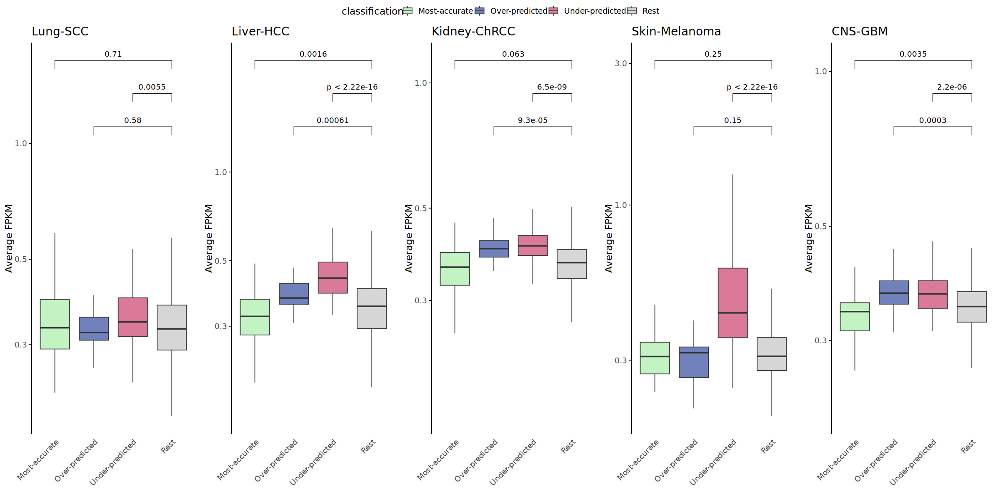

In [30]:
options(repr.plot.width=20)
options(repr.plot.height=10)
cancer_types <- c('Lung-SCC',"Liver-HCC", "Kidney-ChRCC","Skin-Melanoma",'CNS-GBM')  # Example multiple cancer types
TargetTissue_types<-c("Lung","Liver","Kidney","Skin","Brain_Cortex")


# Generate all plots and store them in a list
plot_list <- mapply(process_histone_file, cancer_types, TargetTissue_types, SIMPLIFY = FALSE)

# Arrange multiple plots into one figure (facet-like layout)
final_plot <- ggarrange(plotlist = plot_list, ncol = 6, nrow = 1, common.legend = TRUE, legend = "top")



  # Combine all plots into one with columns merged
  combined_plot <- ggarrange(plotlist = plot_list, ncol = length(plot_list), common.legend = TRUE, nrow = 1)
combined_plot